In [1]:
#from sqlite3 import SQLITE_CREATE_VIEW
import anndata
import scanpy as sc
import os
#from bbknn import bbknn
import matplotlib.pyplot as plt
#import omicverse as ov
#import scib
#from scib_metrics.benchmark import Benchmarker
#import scvi
#import scanorama
import numpy as np
#import pyliger
#from harmony import harmonize
#from rich import print
#import seaborn as sns
#import bbknn
#import doubletdetection
#%matplotlib inline
import pandas as pd
#plt.rcParams.update({'font.size': 12})

In [2]:
plt.rcParams['pdf.fonttype'] = 42  # Ensures that fonts are saved as text, not outlines
plt.rcParams['font.sans-serif'] = ['Arial']  # Use Arial or another common font
# Change the font to 'DejaVu Sans' or another available font
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.rcParams['font.family'] = 'sans-serif'

In [3]:
#####Change path and Load data
os.chdir("/storage/liuxiaodongLab/fanxueying/mayanalysis/2024Aug")
adata = anndata.read_h5ad("scib_human_monkey10.30.h5ad")

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [4]:
adata

AnnData object with n_obs × n_vars = 175274 × 84580
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'reanno', 'lineage', 'unicorns', 'combined_annotation'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'hvg', 'leiden', 'lineage_colors', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap'
    obsm: 'CCA', 'FastMNN', 'Harmony', '

In [5]:
# Check for duplicate row names in adata
duplicate_rows = adata.obs_names[adata.obs_names.duplicated(keep=False)]
duplicate_rows

Index(['TCATTACCAGAGTGTG-1_1_1_1_1_1', 'ACTCTCGCATTACGGT-1_1_1_1',
       'AGCCAATTCGGTCACG-1_1_1_1', 'CTACTATAGCTGACAG-1_1_1_1',
       'GGAATGGTCCACGGAC-1_1_1_1', 'GGAGGATTCTATCCAT-1_1_1_1',
       'AGTGTTGAGCGTGAGT-1_1_1', 'CTGGCAGCAGACACAG-1_1_1',
       'ATAGACCAGCCGTCGT-1_1_1', 'CTTACCGTCTCTAAGG-1_1_1',
       'TGTCCCACAATTGCTG-1_1_1', 'AGGCCACCAAGTTCGT-1_1_2',
       'GTTCCGTAGAGAGCAA-1_1_2', 'TCATTACCAGAGTGTG-1_1_1_1_1_1',
       'ACTCTCGCATTACGGT-1_1_1_1', 'AGCCAATTCGGTCACG-1_1_1_1',
       'CTACTATAGCTGACAG-1_1_1_1', 'GGAATGGTCCACGGAC-1_1_1_1',
       'GGAGGATTCTATCCAT-1_1_1_1', 'AGTGTTGAGCGTGAGT-1_1_1',
       'ATAGACCAGCCGTCGT-1_1_1', 'CTGGCAGCAGACACAG-1_1_1',
       'CTTACCGTCTCTAAGG-1_1_1', 'TGTCCCACAATTGCTG-1_1_1',
       'AGGCCACCAAGTTCGT-1_1_2', 'GTTCCGTAGAGAGCAA-1_1_2'],
      dtype='object')

In [6]:
#fix duplicated row names
import pandas as pd
import numpy as np
import anndata as ad

# Function to update row names and synchronize with obs, obsm, and uns
def update_row_names(adata):
    # Check for duplicate row names
    duplicate_rows = adata.obs_names[adata.obs_names.duplicated(keep=False)]

    if len(duplicate_rows) > 0:
        print(f"Found {len(duplicate_rows)} duplicate row names.")
        
        # Count duplicates
        duplicates_count = pd.Series(adata.obs_names).value_counts()
        duplicates = duplicates_count[duplicates_count > 1].index
        
        # Create a new list to hold updated row names
        updated_names = adata.obs_names.tolist()
        
        # Iterate over the duplicated names
        for dup in duplicates:
            # Get the indices of the duplicated row names
            indices = [i for i, name in enumerate(adata.obs_names) if name == dup]
            
            # Update the row names with a suffix based on their order
            for j, idx in enumerate(indices, 1):
                updated_names[idx] = f"{updated_names[idx]}_{j}"
                
        # Update obs_names in the AnnData object with the modified names
        adata.obs_names = pd.Index(updated_names)

        # Synchronize obs, obsm, and any other necessary attributes
        adata.obs.index = adata.obs_names  # Update the index of obs
        if 'obsm' in adata.uns.keys():
            adata.obsm.index = adata.obs_names  # Update the index of obsm if applicable
        
        print("Duplicate row names relabeled and metadata index updated.")
    else:
        print("No duplicate row names found.")

# Assuming `adata` is your AnnData object
update_row_names(adata)


Found 26 duplicate row names.
Duplicate row names relabeled and metadata index updated.


In [7]:
# Define the desired order of the stages
stage_order = ['E6', 'E6_IVC','E7','E7_IVC', 'E8','E8_IVC', 'E9', 'E9_IVC', 'E10_IVC', 'E11_IVC', 'E12_IVC', 
    'E13', 'E13_IVC', 'E14', 'E14_IVC', 'E15_IVC', 'E16', 'E16_IVC',
    'E17', 'E17_IVC', 'E18_IVC', 'E19_IVC', 'E20_IVC', 'E21_IVC', 
    'E22_IVC', 'CS8', 'E23_IVC', 'E24_IVC', 'E25_IVC','CS7','CS10', 'CS9', 'CS11']

# Convert the 'stage' column to a categorical type with the specified order
adata.obs['stage'] = pd.Categorical(adata.obs['stage'], categories=stage_order, ordered=True)

In [8]:
print(set(adata.obs.reanno))

{'EVTs_1', 'Lateral plate mesoderm_1', 'Emergent mesoderm', 'pre-Allantois', 'YS.Endoderm_2', 'Somite', 'Lateral plate mesoderm_4', 'Erythroid', 'Cardiac myocyte_2', 'Ectoderm_1', 'Rostral mesoderm_3', 'Hemogenic endothelial progenitors', 'STBs_3', 'VE/YE', 'Ectoderm', 'Gut_2', 'Amnion_2', 'Primitive.streak', 'Amnion', 'Neural crest', 'Gut_1', 'Lateral plate mesoderm_3', 'Paraxial mesoderm', 'Epi_4', 'Lateral plate mesoderm_2', 'DE', 'Paraxial.meso', 'TE', 'Allantois_2', 'Notochord', 'Nascent mesoderm', 'Hypoblast_1', 'CTBs_1', 'Cardiac myocyte', 'pre-YS.mesoderm', 'Exe.meso progenitor', 'Amnion_3', 'YS.mesoderm', 'Epi_3', 'Myeloid progenitor', 'PGC', 'YS.Endoderm_1', 'Epi_1', 'Rostral mesoderm_2', 'Hypoblast_2', 'Rostral mesoderm_1', 'pre-somatic mesoderm', 'EVTs_5', 'CTBs_2', 'EVTs_2', 'PGC_2', 'STBs_1', 'Intermediate mesoderm', 'PGC_1', 'STBs_2', 'Neural tube_2', 'Neural tube_1', 'Amnion_1', 'Allantois_1', 'Epi_2', 'AVE', 'Node', 'EVTs_3', 'CTBs', 'Amniotic_epi', 'CTBs_3', 'EVTs_4',

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


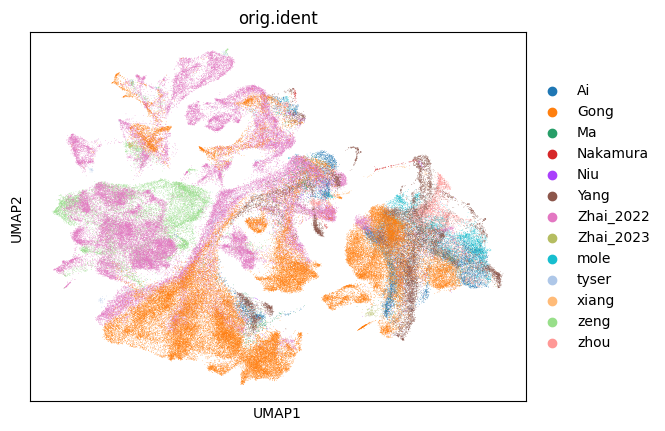

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


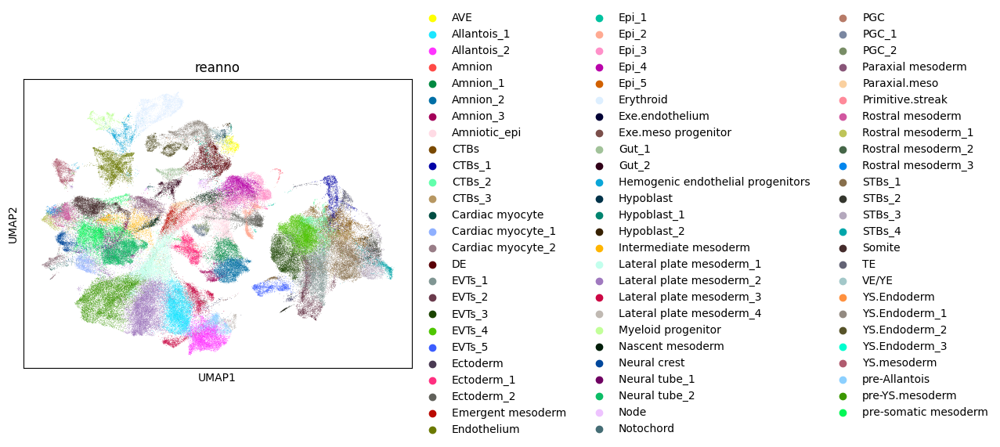

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


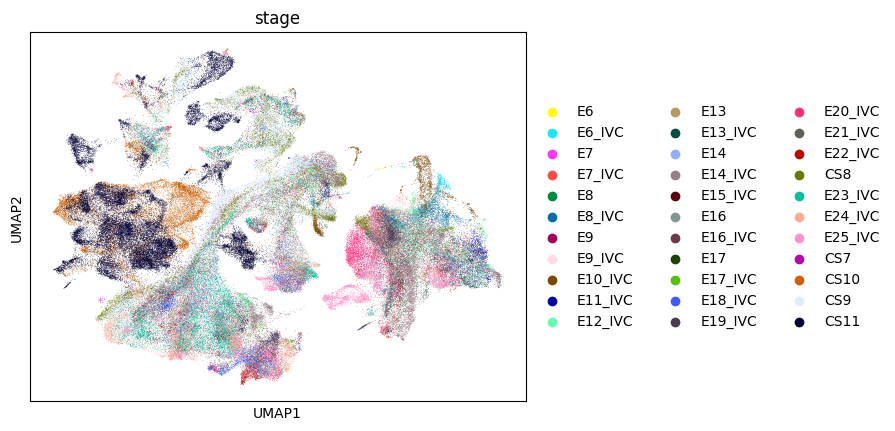

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


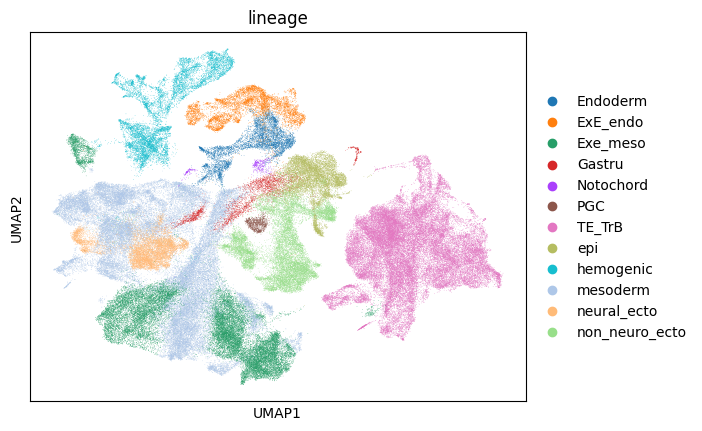

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


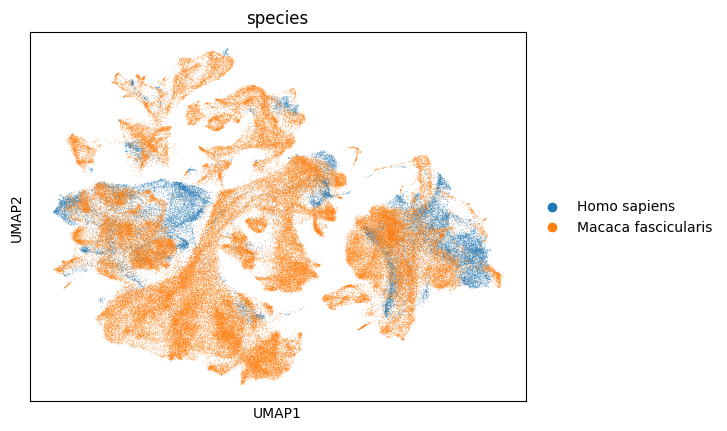

In [9]:
adata.obsm['X_umap']=adata.obsm['X_scANVI']
sc.pl.umap(adata, color=['orig.ident'])
sc.pl.umap(adata, color=['reanno'])
sc.pl.umap(adata, color=['stage'])
sc.pl.umap(adata, color=['lineage'])
sc.pl.umap(adata, color=['species'])

In [10]:
###scANVI
adata_hvg = adata[:, adata.var.highly_variable].copy()
adata_hvg.obsm["scANVI"] = adata.obsm["scANVI"]
sc.pp.neighbors(adata, use_rep="scANVI",random_state=42)
#sc.tl.leiden(adata, key_added="leiden_res0_1", resolution=0.1,random_state=42)
#sc.tl.leiden(adata, key_added="leiden_res0_2", resolution=0.2,random_state=42)
#sc.tl.leiden(adata, key_added="leiden_res0_3", resolution=0.3,random_state=42)
#sc.tl.leiden(adata, key_added="leiden_res0_6", resolution=0.6,random_state=42)
sc.tl.leiden(adata, key_added="leiden_res0_8", resolution=0.8,random_state=42)
sc.tl.leiden(adata, key_added="leiden_res1_0", resolution=1.0,random_state=42)
sc.tl.leiden(adata, key_added="leiden_res1_2", resolution=1.2,random_state=42)

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/pynndescent/pynndescent_.py:346: NumbaPendingDeprecationWarning: Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numba-captured-errors
Exception origin:
  File "/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/numba/core/types/functions.py", line 486, in __getnewargs__
    raise ReferenceError("underlying object has vanished")

  init_rp_tree(data, dist, current_graph, leaf_array)
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/pynndescent/pynndescent_.py:348: NumbaPendingDeprecationWarning: Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


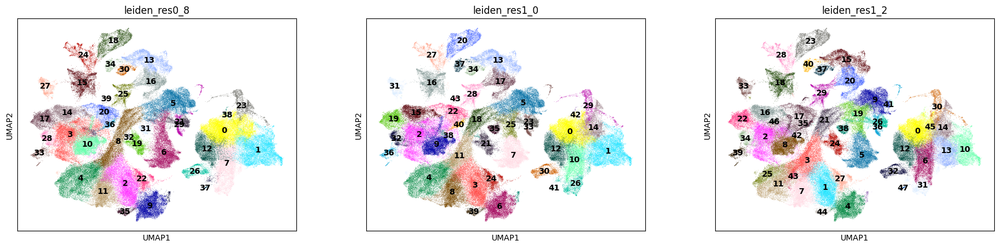

In [11]:
sc.pl.umap(
    adata,
    color=[  "leiden_res0_8","leiden_res1_0","leiden_res1_2"],  #"leiden_res0_1","leiden_res0_2","leiden_res0_3", "leiden_res0_6",
    legend_loc="on data",
)

In [12]:
#correct reanno2
# Update values in the 'reanno' column
adata.obs['reanno'] = adata.obs['reanno'].replace('Paraxial.meso', 'Paraxial mesoderm')
adata.obs['reanno'] = adata.obs['reanno'].replace('Node', 'Notochord')


In [13]:
print(set(adata.obs.reanno))

# Assuming 'reanno' column already exists in adata.obs
# Apply the transformation only to non-NaN values in the 'reanno' column
import re
def remove_suffix(label):
    return re.sub(r'_\d+$', '', label)

# Apply the transformation only to the 'reanno' column in adata.obs
adata.obs['reanno2'] = adata.obs['reanno'].apply(lambda x: remove_suffix(x) if isinstance(x, str) else x)

# Verify if the new column has been added successfully
print(adata.obs[['reanno', 'reanno2']].head())

{'Exe.meso progenitor', 'Gut_2', 'YS.mesoderm', 'EVTs_1', 'Intermediate mesoderm', 'Lateral plate mesoderm_1', 'Emergent mesoderm', 'PGC_1', 'STBs_2', 'Amnion_2', 'pre-Allantois', 'Neural tube_2', 'Primitive.streak', 'YS.Endoderm_2', 'Epi_3', 'Neural tube_1', 'Somite', 'Myeloid progenitor', 'Amnion', 'PGC', 'Neural crest', 'Lateral plate mesoderm_4', 'Gut_1', 'Amnion_1', 'Allantois_1', 'Erythroid', 'Paraxial mesoderm', 'Epi_2', 'Lateral plate mesoderm_3', 'YS.Endoderm_1', 'AVE', 'Epi_1', 'Cardiac myocyte_2', 'Rostral mesoderm_2', 'Hypoblast_2', 'EVTs_3', 'Ectoderm_1', 'CTBs', 'Epi_4', 'Rostral mesoderm_3', 'Rostral mesoderm_1', 'Lateral plate mesoderm_2', 'DE', 'TE', 'Allantois_2', 'pre-somatic mesoderm', 'Amniotic_epi', 'EVTs_5', 'Notochord', 'CTBs_3', 'Hemogenic endothelial progenitors', 'EVTs_4', 'YS.Endoderm_3', 'CTBs_2', 'Rostral mesoderm', 'EVTs_2', 'Hypoblast', 'STBs_3', 'Nascent mesoderm', 'PGC_2', 'Ectoderm_2', 'VE/YE', 'Endothelium', 'Amnion_3', 'Epi_5', 'Hypoblast_1', 'Exe.e

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


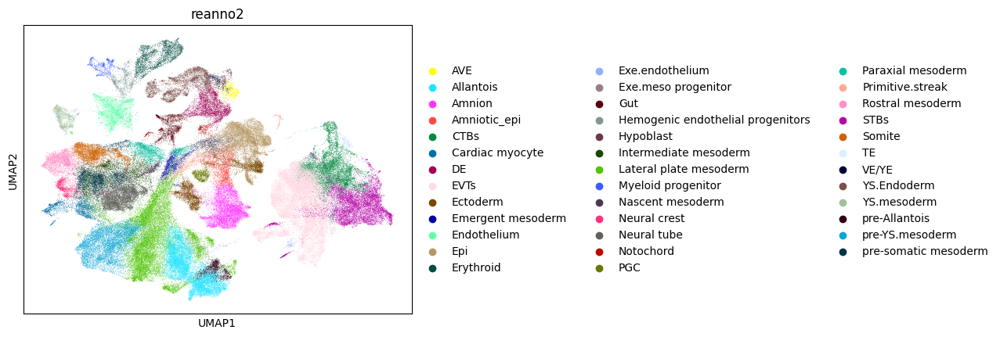

In [14]:
sc.pl.umap(adata, color=['reanno2'])

In [15]:
# further subclustering specific clusters to get reported cell populations
cls_to_recluster = [
    "27", #for meyloid cells
    "2", "3","18",  "22", "38",  #mesoderm
    "13", "17",    #endoderm
    "33",  "5", "24"     
] 

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


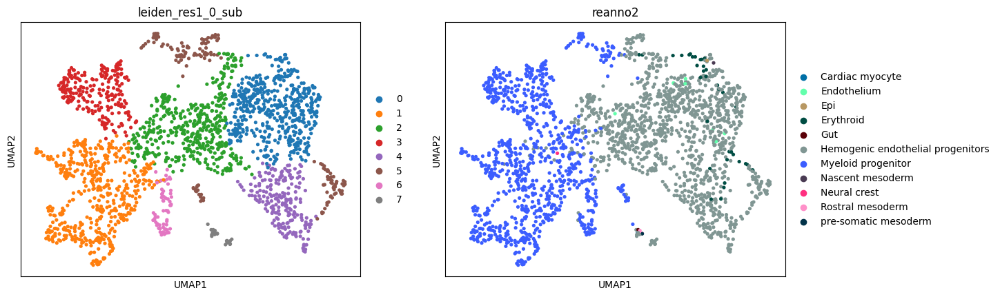

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


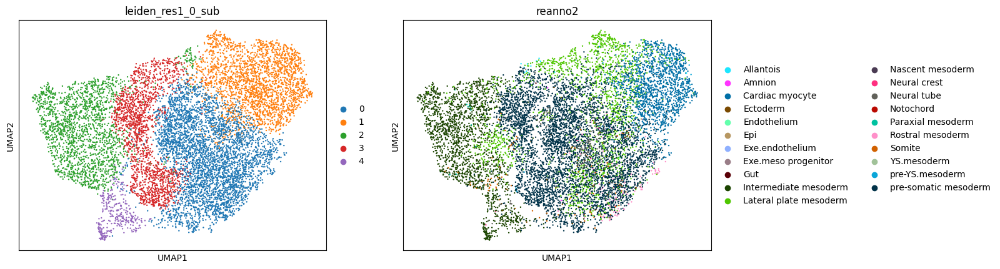

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


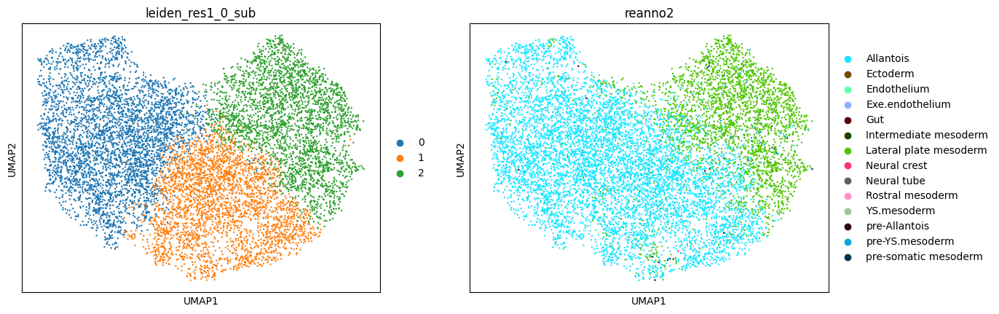

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


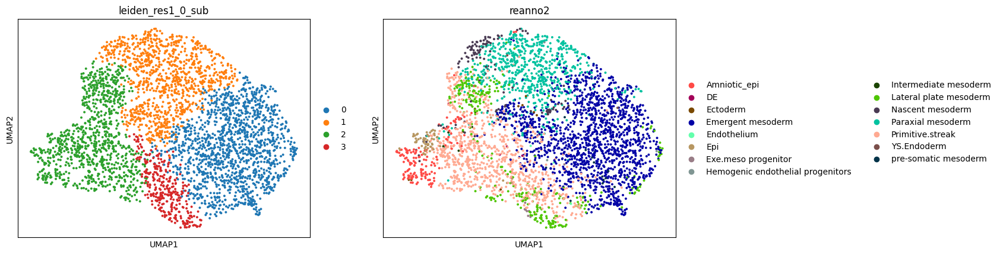

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


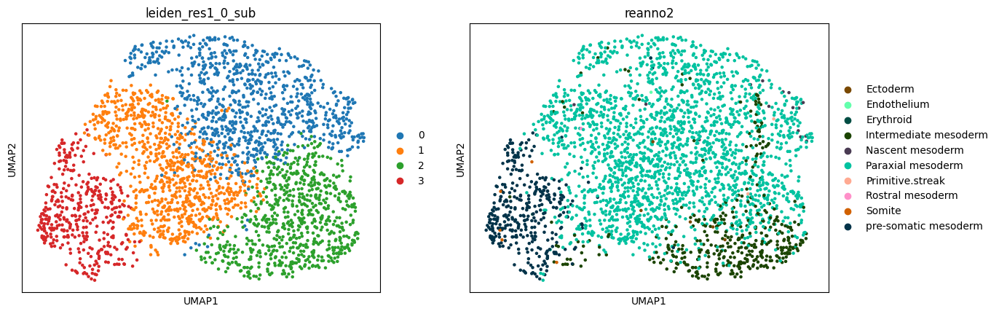

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


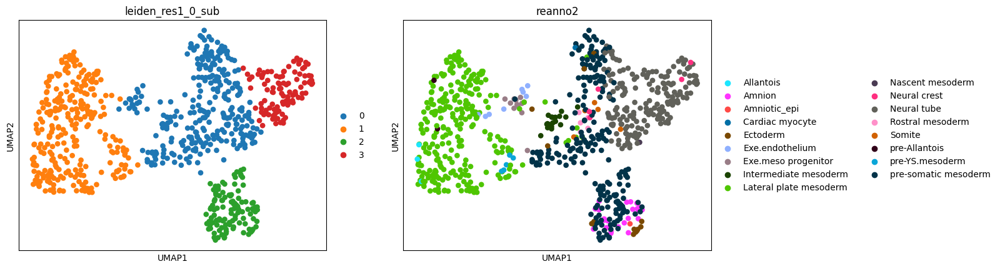

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


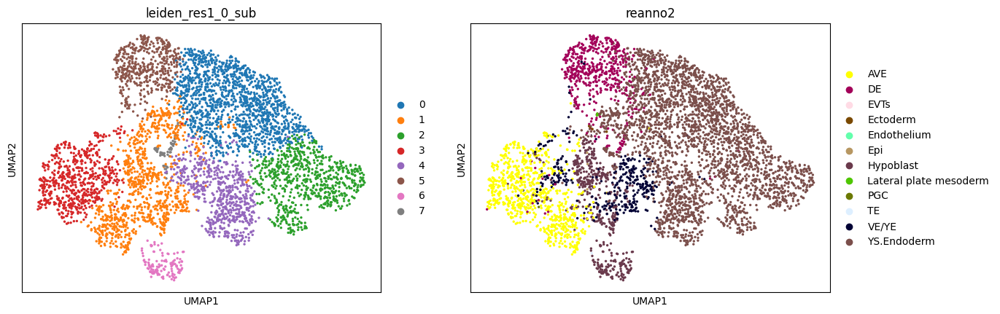

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


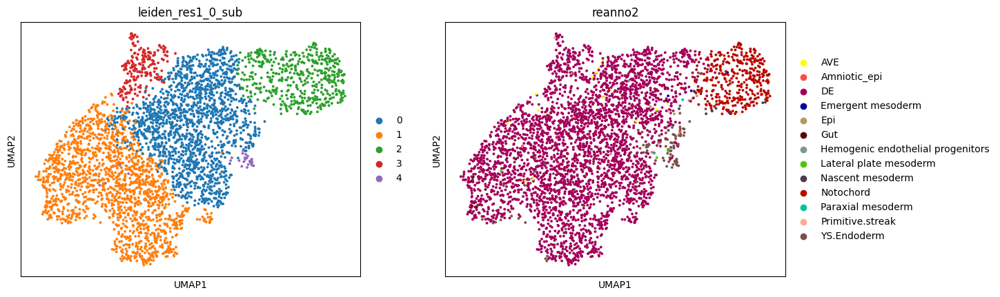

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


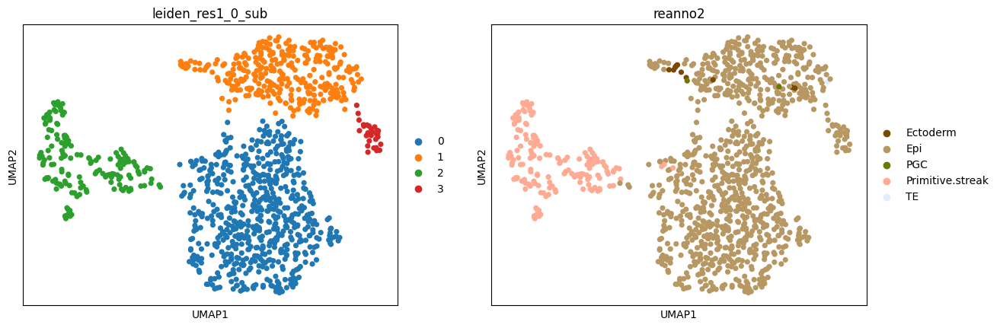

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


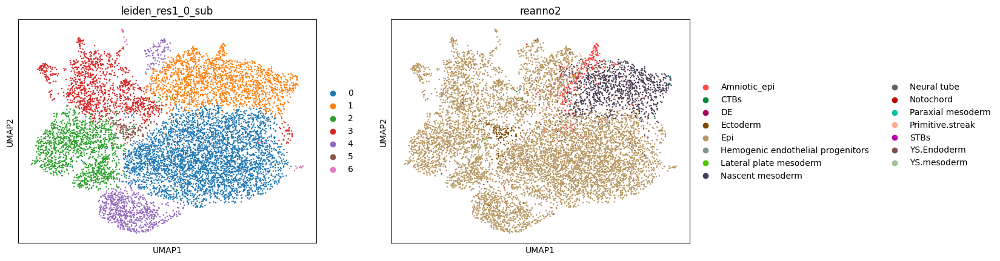

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


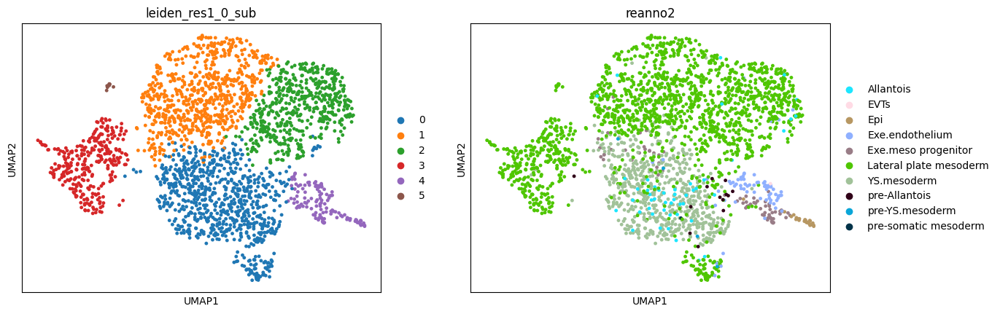

In [16]:
for cl_to_recluster in cls_to_recluster:
    subadata = adata[adata.obs['leiden_res1_0'] == cl_to_recluster, :].copy()
    sc.pp.neighbors(subadata, n_neighbors=10, use_rep="scANVI")
    sc.tl.umap(subadata)
    sc.tl.leiden(subadata, resolution=0.2, key_added="leiden_res1_0_sub")
    
    # Plot and check which cluster is which
    if cl_to_recluster in [ "27", "2", "3","18",  "22", "38","13", "17","33", "5","24"]:
        sc.pl.umap(subadata, color=["leiden_res1_0_sub", "reanno2"])
    
   # Add clustering info to the main object
    if "leiden_res1_0_sub" not in adata.obs.columns:
        adata.obs["leiden_res1_0_sub"] = np.nan
    # Ensure equal lengths before assignment
    sub_len = len(subadata.obs.index)
    ana_len = len(adata.obs.loc[subadata.obs.index])

    if sub_len == ana_len:
        # Update the 'leiden_res1_0_sub' column with new reclustered values
        adata.obs.loc[subadata.obs.index, "leiden_res1_0_sub"] = [
            f"{l4}.{l5}" for l4, l5 in zip(subadata.obs['leiden_res1_0'], subadata.obs['leiden_res1_0_sub'])
        ]
    else:
        raise ValueError(f"Subadata length ({sub_len}) does not match the corresponding length in ana_sub ({ana_len}).")


/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


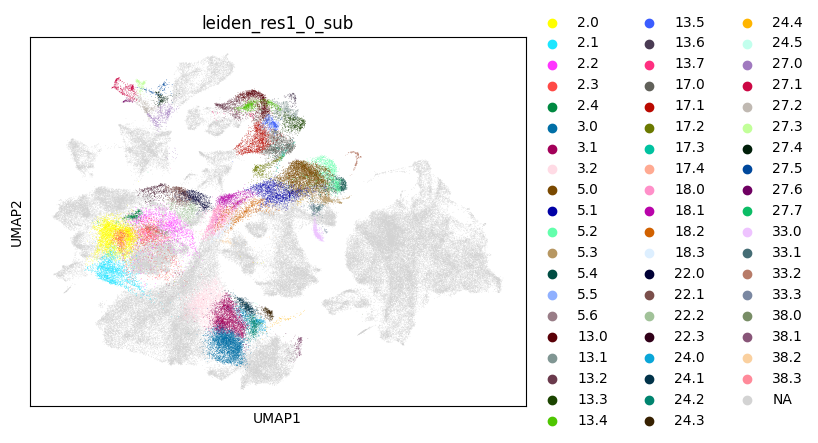

In [17]:
sc.pl.umap(adata, color=['leiden_res1_0_sub'])

In [18]:
#replace leiden3 "0.1.0" and  "0.6.1"  by leiden4
# Identify the clusters in leiden_3 that you want to replace
clusters_to_replace = ['27', '2', '3','18','22','38','13','17','33','5','24']  # replace with your cluster IDs

# Convert leiden_3 and leiden_4 to strings to avoid category mismatches
adata.obs['leiden_res1_0'] = adata.obs['leiden_res1_0'].astype(str)
adata.obs['leiden_res1_0_sub'] = adata.obs['leiden_res1_0_sub'].astype(str)

# Create a copy of leiden_3 to modify
new_leiden_res1_0 = adata.obs['leiden_res1_0'].copy()

# Replace the specified clusters with the subcluster information from leiden_4
for cluster in clusters_to_replace:
    mask = adata.obs['leiden_res1_0'] == cluster
    new_leiden_res1_0[mask] = adata.obs['leiden_res1_0_sub'][mask]

# Update the AnnData object with the new leiden_3 column
adata.obs['leiden_res1_0'] = new_leiden_res1_0

/home/liuxiaodongLab/fanxueying/miniconda3/envs/benchmarking/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


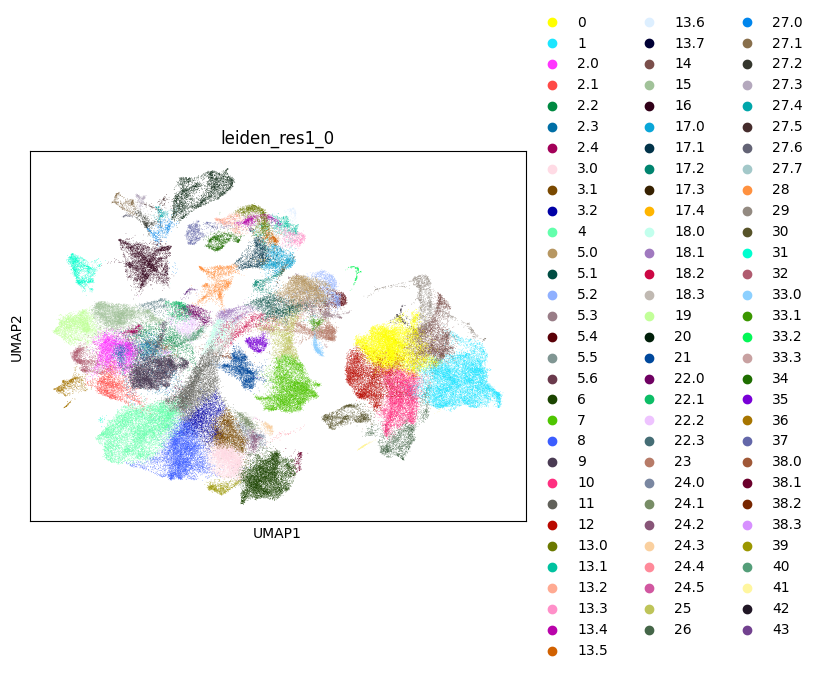

In [19]:
sc.pl.umap(adata, color=['leiden_res1_0'])

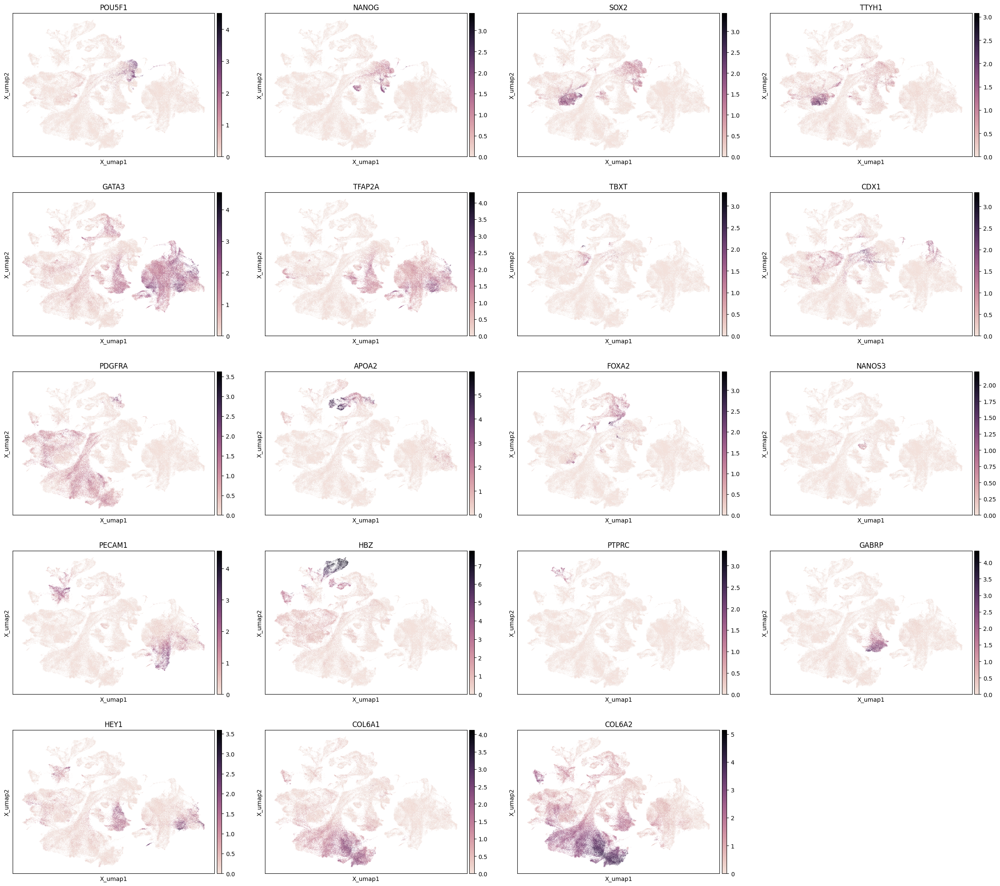

In [20]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
# Define the list of genes you want to plot
genes_to_plot = ["POU5F1", "NANOG",  # Epiblast
                 "SOX2", "TTYH1",    # Neural_ectoderm
                 "GATA3", "TFAP2A", 
                 "TBXT", "CDX1", "PDGFRA", "APOA2", "FOXA2", "NANOS3",
                 "PECAM1", "HBZ", "PTPRC",
                 "GABRP", "HEY1", "COL6A1", "COL6A2"]
# Plot the UMAP embedding for the specified genes
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=genes_to_plot,
    use_raw=False,
    cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True)
)

In [21]:
# Define the list of genes you want to plot
genes_to_plot = ["POU5F1", "NANOG",  # Epiblast
                 "SOX2", "TTYH1",    # Neural_ectoderm
                 "GATA3", "TFAP2A", 
                 "TBXT", "CDX1", "PDGFRA", "APOA2", "FOXA2", "NANOS3",
                 "PECAM1", "HBZ", "PTPRC",
                 "GABRP", "HEY1", "COL6A1", "COL6A2"]

# Calculate the number of rows and columns needed to fit all the plots
n_genes = len(genes_to_plot)
n_cols = 4  # Define how many plots per row
n_rows = (n_genes + n_cols - 1) // n_cols  # Calculate number of rows needed

# Create the PDF
with PdfPages('human_monkey_umap_gene_plots.pdf') as pdf:
    # Set up a large figure for all the subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))  # Adjust figure size
    axes = axes.flatten()  # Flatten axes to easily index them

    for i, gene in enumerate(genes_to_plot):
        ax = axes[i]  # Select the subplot axis
        sc.pl.embedding(
            adata,
            basis='X_umap',
            color=gene,
            use_raw=False,
            cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True),
            show=False,  # Don't display the plot in the interactive window
            ax=ax        # Plot in the current axis
        )
        ax.set_title(gene, fontsize=14)  # Set title for each subplot

    # Remove empty subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    # Save the single page with all plots
    plt.tight_layout()  # Adjust the layout to fit all subplots
    pdf.savefig(fig, dpi=300)  # Save the figure to the PDF with high resolution
    plt.close(fig)  # Close the figure to free up memory


In [22]:
##save dataset
adata.raw.var.rename(columns={'_index': 'index'}, inplace=True)
adata.write_h5ad(filename="human_monkey_clustering.h5ad")